<a href="https://colab.research.google.com/github/NehaKumari500092077/Bird-Species-Identification/blob/main/bandPassFilter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [23]:
pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: WavFileWarning: Chunk (non-data) not understood, skipping it.
  


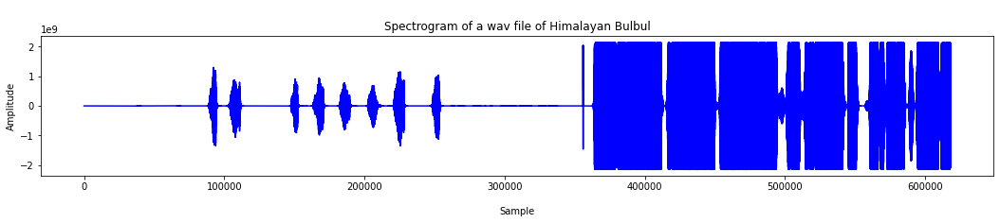

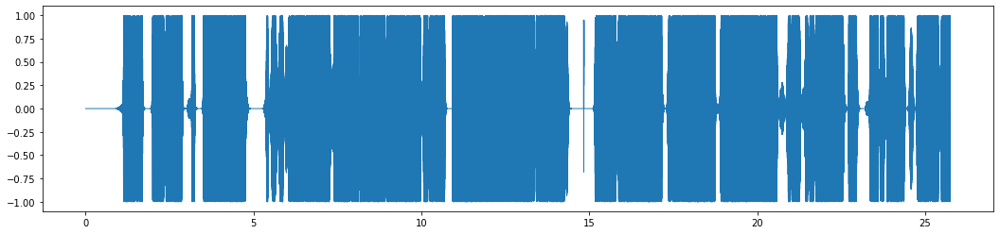

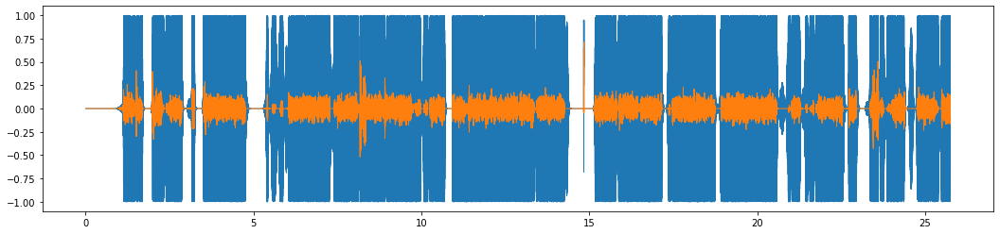

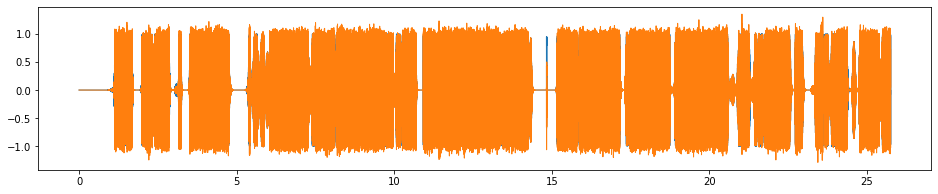

In [26]:
import matplotlib.pyplot as plot
from scipy.io import wavfile
import scipy.signal as sg
from io import BytesIO
import tempfile
import requests
import numpy as np
import scipy.signal as sg
import pydub
from IPython.display import Audio, display

# Read the wav file (mono)

samplingFrequency1, signalData1 = wavfile.read("/content/sample_data/bulbul11.wav")
# Plot the signal read from Himalayan Bulbul wav file
plot.figure(figsize=(18,6))
plot.subplot(211, facecolor='white')
plot.title('\nSpectrogram of a wav file of Himalayan Bulbul')
plot.plot(signalData1, color='blue')

plot.xlabel('\nSample')
plot.ylabel('Amplitude')

def speak(data):
    # We convert the mp3 bytes to wav.
    audio = pydub.AudioSegment.from_wav("/content/sample_data/bulbul11.wav")
    with tempfile.TemporaryFile() as fn:
        wavef = audio.export(fn, format='wav')
        wavef.seek(0)
        wave = wavef.read()
    # We get the raw data by removing the 24 first
    # bytes of the header.
    x = np.frombuffer(wave, np.int16)[24:] / 2.**15
    return x, audio.frame_rate

def play(x, fr, autoplay=False):
    display(Audio(x, rate=fr, autoplay=autoplay))

#url = ('/content/sample_data/Bulbul4.mp3')
#voice = requests.get(url).content
x, fr = speak("/content/sample_data/bulbul11.wav")
play(x, fr)
fig, ax = plt.subplots(1, 1, figsize=(18, 4))
t = np.linspace(0., len(x) / fr, len(x))
ax.plot(t, x, lw=1)

b, a = sg.butter(4, 500. / (fr / 2.), 'low')
x_fil = sg.filtfilt(b, a, x)
play(x_fil, fr)
fig, ax = plt.subplots(1, 1, figsize=(18, 4))
ax.plot(t, x, lw=1)
ax.plot(t, x_fil, lw=1)


b, a = sg.butter(4, 1000. / (fr / 2.), 'high')
x_fil = sg.filtfilt(b, a, x)
play(x_fil, fr)
fig, ax = plt.subplots(1, 1, figsize=(16, 3))
ax.plot(t, x, lw=1)
ax.plot(t, x_fil, lw=1)

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import wave
import sys
import math
import contextlib

fname = '/content/sample_data/Bulbul66.wav'
outname = '/content/sample_data/filtered.wav'

cutOffFrequency = 400.0

# from http://stackoverflow.com/questions/13728392/moving-average-or-running-mean
def running_mean(x, windowSize):
  cumsum = np.cumsum(np.insert(x, 0, 0)) 
  return (cumsum[windowSize:] - cumsum[:-windowSize]) / windowSize

# from http://stackoverflow.com/questions/2226853/interpreting-wav-data/2227174#2227174
def interpret_wav(raw_bytes, n_frames, n_channels, sample_width, interleaved = True):
    print(sample_width)
    if sample_width == 1:
        dtype = np.uint8 # unsigned char
    elif sample_width == 4:
        dtype = np.int16 # signed 2-byte short
    else:
        raise ValueError("Only supports 8 and 16 bit audio formats.")

    channels = np.fromstring(raw_bytes, dtype=dtype)

    if interleaved:
        # channels are interleaved, i.e. sample N of channel M follows sample N of channel M-1 in raw data
        channels.shape = (n_frames, n_channels)
        channels = channels.T
    else:
        # channels are not interleaved. All samples from channel M occur before all samples from channel M-1
        channels.shape = (n_channels, n_frames)

    return channels

with contextlib.closing(wave.open(fname,'rb')) as spf:
    sampleRate = spf.getframerate()
    ampWidth = spf.getsampwidth()
    nChannels = spf.getnchannels()
    nFrames = spf.getnframes()

    print("sampleRate",sampleRate)
    print("ampWidth",ampWidth)
    print("nChannels",nChannels)
    print("nFrames",nFrames)

    # Extract Raw Audio from multi-channel Wav File
    signal = spf.readframes(nFrames*nChannels)
    spf.close()
    channels = interpret_wav(signal, nFrames, nChannels, ampWidth, True)

    # get window size
    # from http://dsp.stackexchange.com/questions/9966/what-is-the-cut-off-frequency-of-a-moving-average-filter
    freqRatio = (cutOffFrequency/sampleRate)
    N = int(math.sqrt(0.196196 + freqRatio**2)/freqRatio)

    # Use moviung average (only on first channel)
    filtered = running_mean(channels[0], N).astype(channels.dtype)

    wav_file = wave.open(outname, "w")
    wav_file.setparams((1, ampWidth, sampleRate, nFrames, spf.getcomptype(), spf.getcompname()))
    wav_file.writeframes(filtered.tobytes('C'))
    wav_file.close()

sampleRate 44100
ampWidth 4
nChannels 2
nFrames 851951
4


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


ValueError: ignored

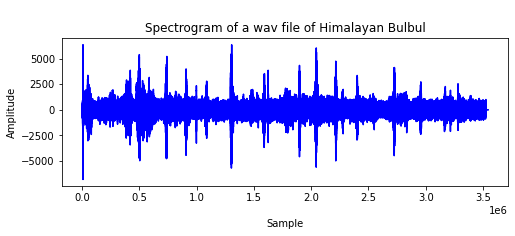

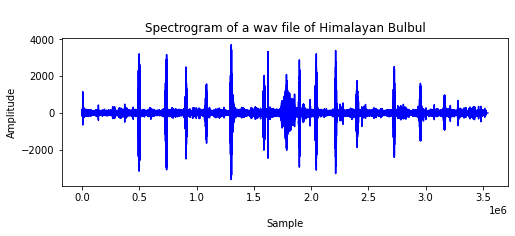

In [43]:
import matplotlib.pyplot as plot
from scipy.io import wavfile
import scipy.signal as sg
from io import BytesIO
import tempfile
import requests
import numpy as np
import scipy.signal as sg
import pydub
from IPython.display import Audio, display
from scipy.io.wavfile import write

# Read the wav file (mono)

def bandPassFiler(signal):
  fs=50000.00
  lowcut=50000.0
  highcut=1250.0

  nyq=0.5*fs
  low=lowcut/nyq
  high=highcut/nyq

  order=1

  b,a=sg.butter(order,0.10,'highpass',analog=False)
  y=sg.filtfilt(b,a,signal)

  return(y)

samplingFrequency1, signalData1 = wavfile.read("/content/sample_data/Bulbul4.wav")

sensor_data=np.array(signalData1[:,0])

plot.figure(figsize=(8,6))
plot.subplot(211, facecolor='white')
plot.title('\nSpectrogram of a wav file of Himalayan Bulbul')
plot.plot(signalData1, color='blue')
plot.xlabel('\nSample')
plot.ylabel('Amplitude')


filtered_signal=bandPassFiler(sensor_data)
#plot.plot(filtered_signal, color='red')
#plot.show()
plot.figure(figsize=(8,6))
plot.subplot(211, facecolor='white')
plot.title('\nSpectrogram of a wav file of Himalayan Bulbul')
plot.plot(filtered_signal, color='blue')
plot.xlabel('\nSample')
plot.ylabel('Amplitude')


#data = np.random.uniform(-1,1,44100) # 44100 random samples between -1 and 1
scaled = np.int16(filtered_signal/np.max(np.abs(filtered_signal)) * 32767)
write('/content/sample_data/test.wav', 44100, scaled)








In [3]:
# import required modules
from os import path
from pydub import AudioSegment
  
# assign files
bulbul_mp3_file = "/content/sample_data/Bulbul4.mp3"
bulbul_wav_file = "/content/sample_data/Bulbul4.wav"

# convert mp3 file to wav file
sound = AudioSegment.from_mp3(bulbul_mp3_file)
sound.export(bulbul_wav_file, format="wav")

<_io.BufferedRandom name='/content/sample_data/Bulbul4.wav'>